<div style="max-width:1000px">

<h2 style="line-height:1.4; font-weight:600; margin-bottom:10px;">
KOMPARASI ARSITEKTUR MOBILENETV3 DAN EFFICIENTNET-B2 PADA KLASIFIKASI KANKER KULIT MELANOMA DAN NON-MELANOMA
</h2>

<p style="color:#6e6e73; margin-top:0;">
Deep Learning Project • Multiclass Image Classification
</p>

<hr style="border:none; border-top:1px solid #e5e5e5; margin:15px 0;">

<div style="font-size:16px; line-height:1.6;">
    <p style="margin:2px 0;"><b>Author:</b> Vania Angelica</p>
    <p style="margin:2px 0;"><b>Task:</b> Persiapan Dataset</p>
    <p style="margin:2px 0;"><b>Dataset:</b> ISIC Tahun 2019 </p>
</div>

<h4 style="line-height:1.4; font-weight:600; margin-bottom:10px;">
Deskripsi
</h4>

<div style="font-size:16px; line-height:1.7; text-align: justify">
    <p>
    Pada notebook ini akan berfokus pada persiapan dataset sebelum masuk ke dalam tahap
    preprocessing dan training model. 
    Hal ini bertujuan agar data yang akan digunakan memiliki kualitas yang baik dan sesuai dengan
    permasalahan yang diteliti. Adapun hal yang dilakukan yaitu:
    </p>
    <ul style="padding-left:20px">
        <li><span style="font-weight:600;">Crosscheck Dataset</span>
            <p style="margin-top:5px;">
            Dataset yang saya gunakan dari Kaggle yang dipublikasikan oleh 
            <span style="font-weight:600;">Riya Eliza Shaju</span>, dataset ini berasal dari 
            website resmi challenge ISIC tahun 2019. Perbedaan dataset yang ada di publish di
            sini dengan yang ada di website resminya adalah, dataset ini sudah dikelompokkan
            menjadi 8 kelas,sedangkan jika menggunakan dataset dari website resmi harus 
            mengelompokkannya sendiri. Hal ini cukup memakan banyak waktu dan komputasi. Namun,
            untuk memastikan bahwa dataset ini benar-benar sesuai dengan dataset resmi ISIC, saya
            melakukan crosscheck apakah citra yang sudah dikelompokkan per kelas sesuai dengan data
            metadata dan ground truth.
            </p>
        </li>
        <li><span style="font-weight:600;">Check Duplikasi Gambar</span>
            <p style="margin-top:5px;">
            Dataset ISIC 2019 merupakan integrasi dari dataset HAM10000, BCN_20000, dan dataset dari 
            tantangan ISIC tahun sebelumnya. Hal ini memungkinkan adanya duplikasi gambar. Oleh karena
            itu, saya melakukan pengecekan duplikasi menggunakan image hashing. Proses ini dilakukan berdasarkan 
            penelitian terdahulu agar dataset yang digunakan benar-benar bersih dan sesuai.
            </p>
        </li>
    </ul>
</div>

<div style="
    padding-left: 18px;
    border-left: 4px solid #111827;
    margin-top: 25px;
">

<h3 style="
    margin-bottom: 8px;
    font-weight: 600;
">
Tahap 1 - Struktur Folder Dataset
</h3>

<p style="
    font-size: 16px
    margin-top: 0;
    color: #555;
    line-height: 1.7;
">
Disini kita akan melihat bagaimana tampilan struktur folder inputan 
agar kita memahami susunan dataset yang digunakan.
</p>

</div>

In [1]:
import os              
import pandas as pd    
import hashlib         
import numpy as np     
import cv2             
import time            
import matplotlib.pyplot as plt       
import matplotlib.image as mpimg      
from collections import defaultdict
from collections import Counter

print("import selesai")

import selesai


In [2]:
#cek struktur folder dataset dan declare path dataset 

PATH_DATASET = '/kaggle/input/datasets/riyaelizashaju/isic-skin-disease-image-dataset-labelled/ISIC_Labelled'

for nama_folder in sorted(os.listdir(PATH_DATASET)):
    jumlah = len(os.listdir(os.path.join(PATH_DATASET, nama_folder)))
    print(f"{nama_folder}: {jumlah} file")

Actinic keratosis: 867 file
Basal cell carcinoma: 3323 file
Benign keratosis: 2624 file
Dermatofibroma: 239 file
Melanocytic nevus: 12875 file
Melanoma: 4522 file
Squamous cell carcinoma: 628 file
Vascular lesion: 253 file


<div style="
    padding-left: 18px;
    border-left: 4px solid #111827;
    margin-top: 25px;
">

<h3 style="
    margin-bottom: 8px;
    font-weight: 600;
">
Tahap 2 - Crosscheck Dataset Kaggle dengan File Metadata dan Groundtruth
</h3>

<p style="
    font-size: 16px
    margin-top: 0;
    color: #555;
    line-height: 1.7;
">
Kita akan check apakah dataset yang di kaggle ini sesuai dengan groundtruth. Di groundtruth itu datanya disimpen dengan one-hot-encode. Jadi, misalkan ada gambar punya nilai 1.0 pada kolom kelas A, dan nilai pada kolom kelas lainnya 0.0. Berarti gambar tersebut masuk pada kelas A.
</p>
</div>

In [3]:
path_dataset = '/kaggle/input/datasets/riyaelizashaju/isic-skin-disease-image-dataset-labelled/ISIC_Labelled'
path_groundtruth = '/kaggle/input/datasets/vaniaangelica/isic-2019-training-metadata-and-groundtruth/ISIC_2019_Training_GroundTruth.csv'

kelas_kanker = ['Melanoma', 'Basal cell carcinoma', 'Squamous cell carcinoma']
kode_kelas = {
    'Melanoma'               : 'MEL',
    'Basal cell carcinoma'   : 'BCC',
    'Squamous cell carcinoma': 'SCC',
}
#baca tabel groundtruth
df_gt = pd.read_csv(path_groundtruth)

#Mengambil file gambar tanpa extensi dari dataset
gambar_per_folder = {}
for nama_folder in kelas_kanker:
    path_folder = os.path.join(path_dataset, nama_folder)
    nama_file = [os.path.splitext(f)[0]
                 for f in os.listdir(path_folder)
                 if f.lower().endswith(('.jpg', '.jpeg', '.png'))]
    gambar_per_folder[nama_folder] = set(nama_file)

#Crosscheck Data Kaggle dengan Data Ground Truth
print("Crosscheck Data Kaggle dengan Data Ground Truth")
print("=" * 50)

total_mismatch = 0
for nama_folder in kelas_kanker:
    kode       = kode_kelas[nama_folder]
    di_dataset = gambar_per_folder[nama_folder]
    di_gt      = set(df_gt[df_gt[kode] == 1.0]['image'].tolist())

    salah_kelas = []
    for img in di_dataset:
        baris = df_gt[df_gt['image'] == img]
        if not baris.empty:
            if baris.iloc[0][kode] != 1.0:
                salah_kelas.append(img)
                
    hanya_dataset = di_dataset - di_gt
    hanya_gt     = di_gt - di_dataset
    
    print(" ")
    print(f"[{kode}] {nama_folder}")
    print(f"Gambar di folder dataset   : {len(di_dataset)}")
    print(f"Cocok dengan groundtruth   : {len(di_dataset & di_gt)}")
    print(f"Hanya di folder dataset    : {len(hanya_dataset)}")
    print(f"Hanya di groundtruth       : {len(hanya_gt)}")
    print(f"Salah kelas                : {len(salah_kelas)}")
    total_mismatch += len(salah_kelas)

#missmatch nya ini gabungan dari 3 kelas ya 
print("")
print(f"Total mismatch label : {total_mismatch}")
if total_mismatch == 0:
    print("Dataset Valid, semua label sesuai Ground Truth")

Crosscheck Data Kaggle dengan Data Ground Truth
 
[MEL] Melanoma
Gambar di folder dataset   : 4522
Cocok dengan groundtruth   : 4522
Hanya di folder dataset    : 0
Hanya di groundtruth       : 0
Salah kelas                : 0
 
[BCC] Basal cell carcinoma
Gambar di folder dataset   : 3323
Cocok dengan groundtruth   : 3323
Hanya di folder dataset    : 0
Hanya di groundtruth       : 0
Salah kelas                : 0
 
[SCC] Squamous cell carcinoma
Gambar di folder dataset   : 628
Cocok dengan groundtruth   : 628
Hanya di folder dataset    : 0
Hanya di groundtruth       : 0
Salah kelas                : 0

Total mismatch label : 0
Dataset Valid, semua label sesuai Ground Truth


<div style="
    padding-left: 18px;
    border-left: 4px solid #111827;
    margin-top: 25px;
">
    
<h3 style="
    margin-bottom: 8px;
    font-size: 24px;
    font-weight: 600;
"> Tahap 3 - Cek Duplikasi Gambar
</h3>

<p style="
    margin-top: 0;
    color: #555;
    line-height: 1.7;
">
Disini kita akan menghapus gambar yang mirip identik, melalui image hashing. Image Hashing adalah proses mengubah gambar menjadi rangkaian karakter atau angka berukuran tetap (hash). Gambar yang memiliki hash yang sama, kemungkinan gambar yang duplikat </p>

</div>

In [4]:
print("Cek Duplikasi Gambar")
print("=" * 50)

# Fungsi hitung hash MD5
def hitung_hash(path_file):
    hasher = hashlib.md5()
    with open(path_file, 'rb') as f:
        while True:
            potongan = f.read(8192)
            if not potongan:
                break
            hasher.update(potongan)
    return hasher.hexdigest()

# Hitung hash semua gambar dari 3 kelas
hash_map = defaultdict(list)

for nama_folder in kelas_kanker:
    kode        = kode_kelas[nama_folder]
    path_folder = os.path.join(path_dataset, nama_folder)
    
    for nama_file in os.listdir(path_folder):
        if nama_file.lower().endswith(('.jpg', '.jpeg', '.png')):
            path_file = os.path.join(path_folder, nama_file)
            h = hitung_hash(path_file)
            hash_map[h].append({
                'path'  : path_file,
                'kelas' : kode
            })
            
#Hapus duplikasi dan simpan file yang baru
path_unik  = []
label_unik = []
total_dup  = 0
dup_per_kelas = {}

for h, daftar in hash_map.items():
    path_unik.append(daftar[0]['path'])
    label_unik.append(daftar[0]['kelas'])
    
    if len(daftar) > 1:
        for gambar in daftar[1:]:
            kls = gambar['kelas']
            dup_per_kelas[kls] = dup_per_kelas.get(kls, 0) + 1
        total_dup += len(daftar) - 1

print("Hasil Cek Duplikasi")
print("=" * 50)
print(f"Total gambar dicek     : {sum(len(v) for v in hash_map.values())}")
print(f"Duplikat dihapus       : {total_dup}")
print(f"Gambar unik tersisa    : {len(path_unik)}")

print(" ")
print("Duplikat per kelas:")
for kls, jumlah in sorted(dup_per_kelas.items()):
    print(f"{kls} : {jumlah} duplikat")

#cek sinkronasi, apakah file yang dihapus cocok dengan label yang disimpan
#intinya jangan sampe filenya kehapus tapi labelnya masih pake yang lama. 
print(" ")
print("Cek Sinkronisasi")
print("=" * 50)

print("Jumlah kelas baru")
per_kelas = Counter(label_unik)
for kls, jumlah in sorted(per_kelas.items()):
    print(f"{kls} : {jumlah} gambar")
    
print(" ")
if len(path_unik) == len(label_unik):
    print(f"Hasil Sinkron, path_unik dan label_unik sama ({len(path_unik)} gambar)")
else:
    print("TIDAK SINKRON!")

Cek Duplikasi Gambar
Hasil Cek Duplikasi
Total gambar dicek     : 8473
Duplikat dihapus       : 15
Gambar unik tersisa    : 8458
 
Duplikat per kelas:
BCC : 7 duplikat
MEL : 8 duplikat
 
Cek Sinkronisasi
Jumlah kelas baru
BCC : 3316 gambar
MEL : 4514 gambar
SCC : 628 gambar
 
Hasil Sinkron, path_unik dan label_unik sama (8458 gambar)


Visualisasi Gambar Duplikat
Total grup duplikat : 15
 


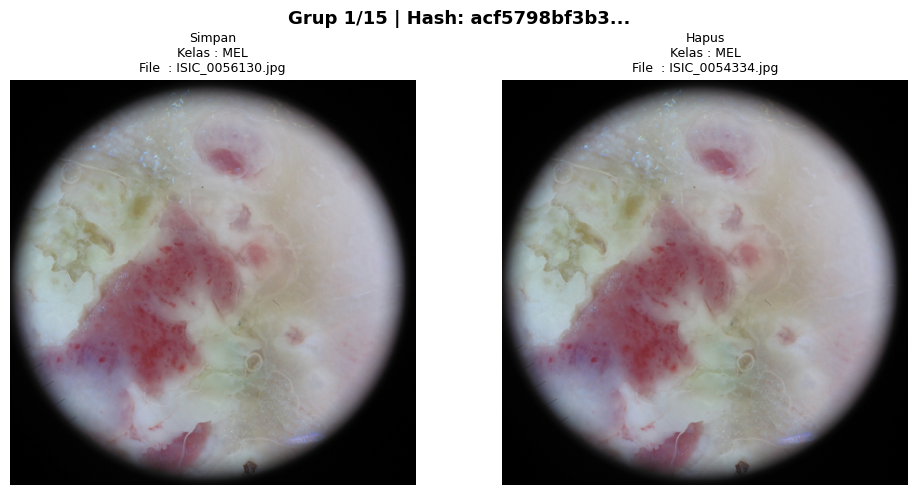

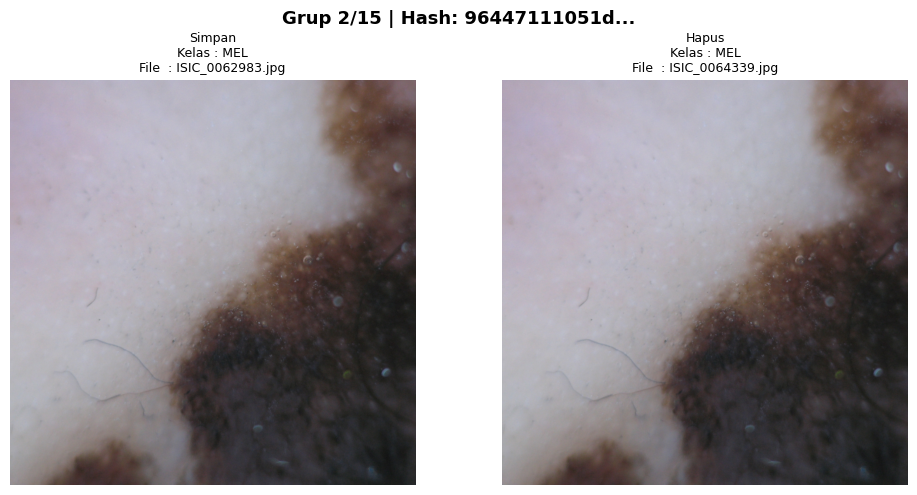

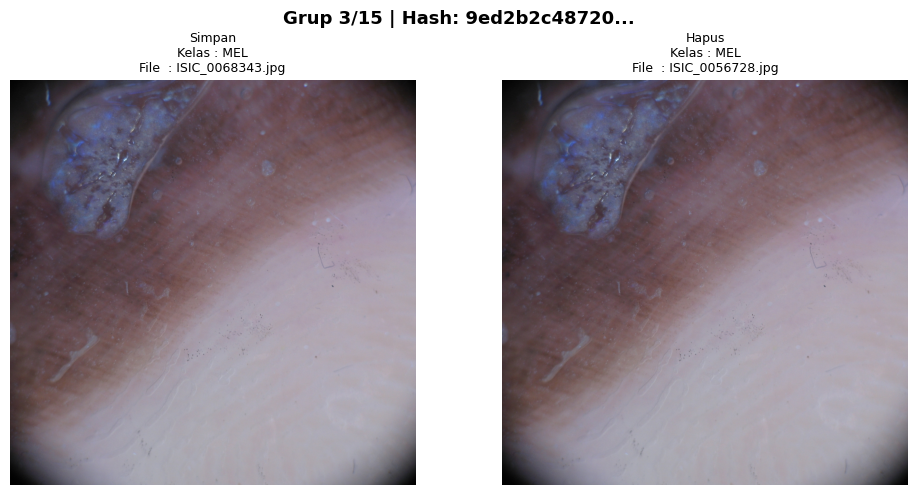

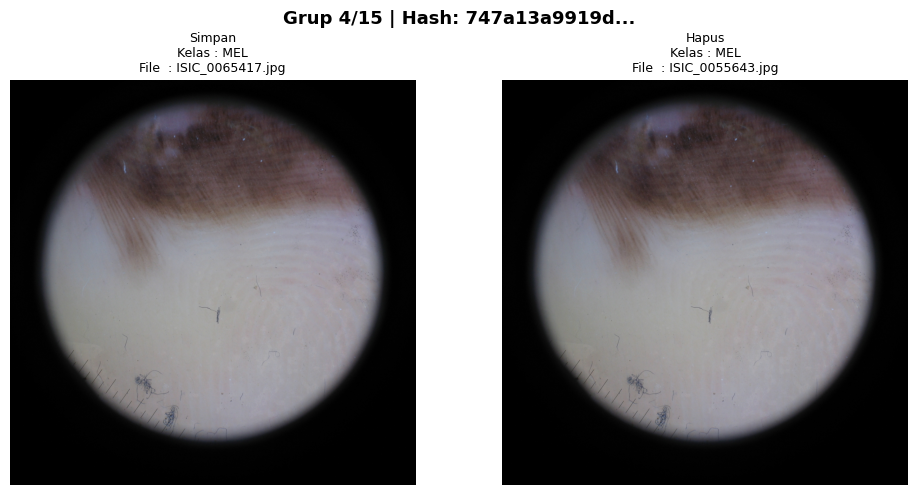

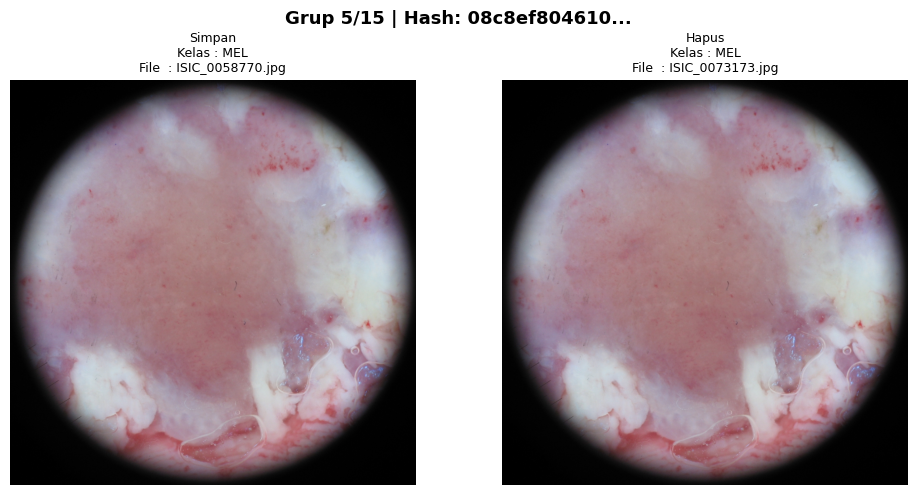

...

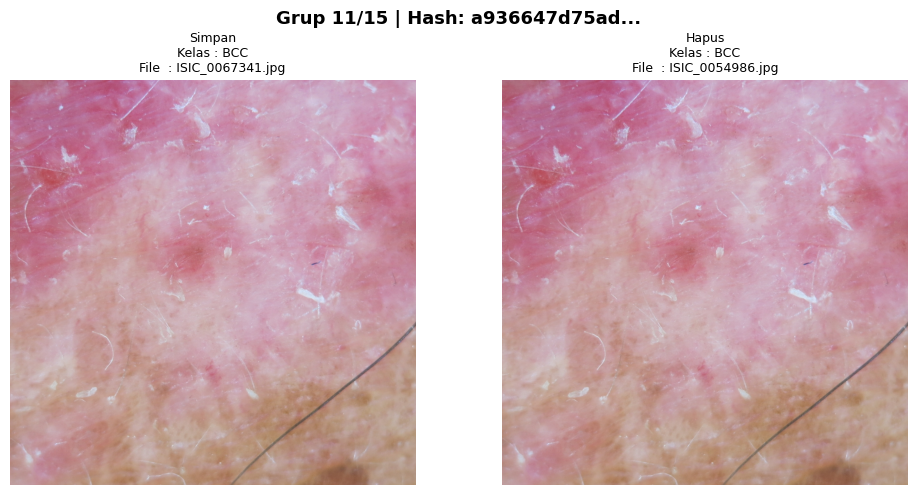

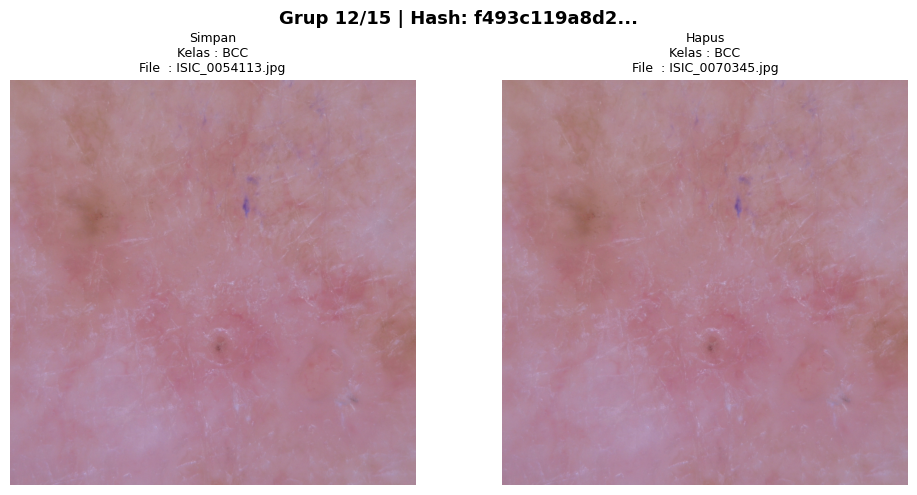

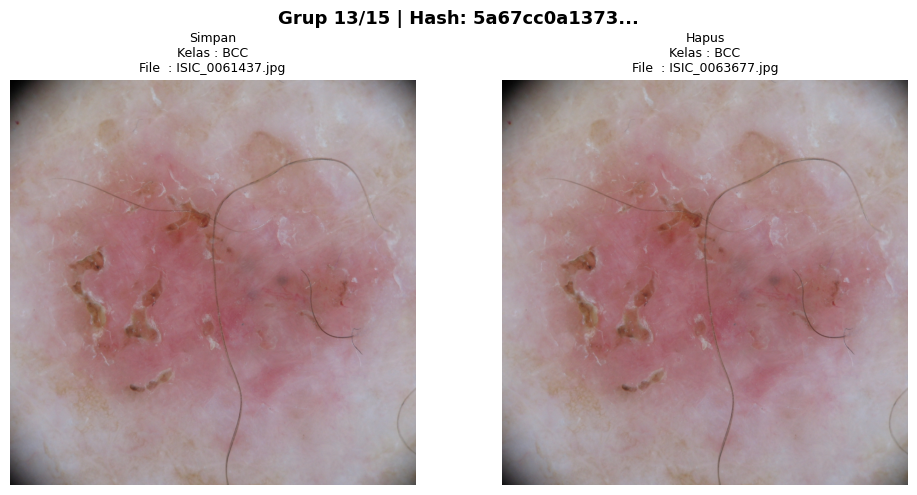

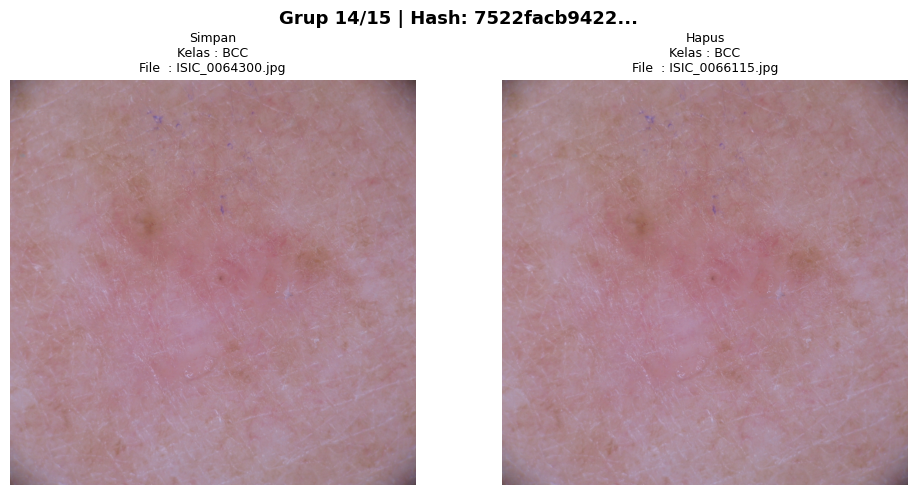

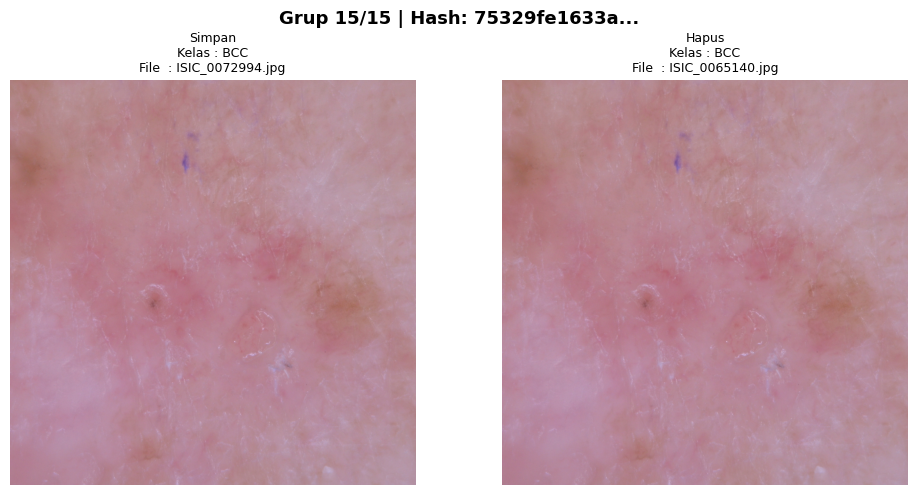

Selesai! Total duplikat : 15 file


In [5]:
print("Visualisasi Gambar Duplikat")
print("=" * 50)

# Filter hanya yang duplikat dari hash_map yang sudah ada
#jadi ini isinya laci hash yang duplikat aja 
grup_duplikat = {h: imgs for h, imgs in hash_map.items() if len(imgs) > 1}
total_grup    = len(grup_duplikat)

print(f"Total grup duplikat : {total_grup}")
print(" ")

for nomor, (h, daftar_gambar) in enumerate(grup_duplikat.items(), 1):
    jumlah    = len(daftar_gambar)
    fig, axes = plt.subplots(1, jumlah, figsize=(5 * jumlah, 5))

    if jumlah == 1:
        axes = [axes]

    fig.suptitle(f'Grup {nomor}/{total_grup} | Hash: {h[:12]}...',fontsize=13, fontweight='bold')

    for j, info in enumerate(daftar_gambar):
        status = "Simpan" if j == 0 else "Hapus"
        axes[j].imshow(mpimg.imread(info['path']))
        axes[j].set_title(f"{status}\nKelas : {info['kelas']}\nFile  : {info['path'].split('/')[-1]}",fontsize=9)
        axes[j].axis('off')

    plt.tight_layout()
    plt.show()

print(f"Selesai! Total duplikat : {sum(len(v)-1 for v in grup_duplikat.values())} file")

<div style="
    padding-left: 18px;
    border-left: 4px solid #111827;
    margin-top: 25px;
">
    
<h3 style="
    margin-bottom: 8px;
    font-size: 24px;
    font-weight: 600;
"> Tahap 4 - Tahapan Preprocessing
</h3>

<p style="
    margin-top: 0;
    color: #555;
    line-height: 1.7;
">
Dalam seluruh tahapan preprocessin pada penelitian saya, disini kita akan masuk kebagian dull razor hair removal dan resizing citra. Pertama-tama kita akan membuat fungsi hair removal dan fungsi keseluruhan. setelah itu saya akan menampilkan visualisasi terkait tahapan hair removal(yang saya tampilkan hanya contoh untuk setiap kelas 1 gambar saja). terakhir kita akan melakukan preprocessing untuk seluruh gambar.</p>

</div>

In [6]:
# Fungsi Dull Razor Hair Removal 
IMG_SIZE = 224  

def hapus_rambut(image):
    """
    image: numpy array gambar dalam format BGR (langsung dari cv2.imread)
    result: gambar BGR yang sudah dibersihkan dari rambut
    """
    # Langkah 1: Ubah ke grayscale untuk deteksi rambut
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    # Langkah 2: Black Hat morphology
    kernel = cv2.getStructuringElement(cv2.MORPH_CROSS, (15, 15))
    blackhat = cv2.morphologyEx(gray, cv2.MORPH_BLACKHAT, kernel)

    # Langkah 3: Thresholding untuk membuat mask rambut
    _, mask = cv2.threshold(blackhat, 20, 255, cv2.THRESH_BINARY)

    # Langkah 4: Inpainting menggunakan algoritma Telea
    result = cv2.inpaint(image, mask, inpaintRadius=3, flags=cv2.INPAINT_TELEA)

    return result


def preprocess_gambar(path_gambar, img_size=IMG_SIZE):
    """
    path_gambar: path lengkap ke file gambar (dari daftar_path_unik)
    img_size: ukuran target (224x224)
    result: gambar RGB yang sudah diproses, atau None jika gagal
    """
    image = cv2.imread(path_gambar)
    if image is None:
        print(f"Gagal membaca {path_gambar}")
        return None
    image = hapus_rambut(image) #tahap dull razor
    image = cv2.resize(image, (img_size, img_size), interpolation=cv2.INTER_AREA) #tahap resize ke 224 x 224
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB) # konversi dari BGR ke RGB
    return image

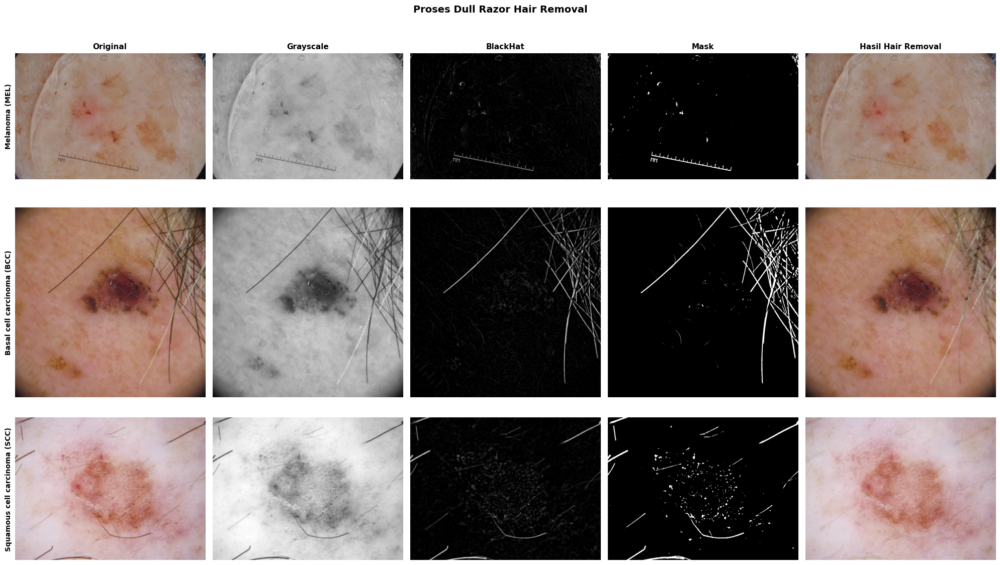

In [7]:
# Visualisasi Dull Razor Hair Removal

#Ambil 1 gambar contoh dari setiap kelas
contoh_per_kelas = []
for nama_folder in kelas_kanker:
    kode = kode_kelas[nama_folder]
    # Cari gambar pertama yang labelnya sesuai kode ini
    for idx, label in enumerate(label_unik):
        if label == kode:
            contoh_per_kelas.append((nama_folder, kode, path_unik[idx]))
            break

# Buat grid 3 baris (1 per kelas) x 5 kolom (setiap tahapan)
fig, axes = plt.subplots(3, 5, figsize=(20, 12))
judul_kolom = ['Original', 'Grayscale', 'BlackHat', 'Mask', 'Hasil Hair Removal']

for baris, (nama_folder, kode, path_gambar) in enumerate(contoh_per_kelas):

    # Baca gambar original (format BGR dari OpenCV)
    original = cv2.imread(path_gambar)
    original_rgb = cv2.cvtColor(original, cv2.COLOR_BGR2RGB)

    # Tahap 1: Grayscale
    gray = cv2.cvtColor(original, cv2.COLOR_BGR2GRAY)

    # Tahap 2: Black Hat Transform
    kernel = cv2.getStructuringElement(cv2.MORPH_CROSS, (15, 15))
    blackhat = cv2.morphologyEx(gray, cv2.MORPH_BLACKHAT, kernel)
    
    # Tahap 3: Mask
    _, mask = cv2.threshold(blackhat, 20, 255, cv2.THRESH_BINARY)
    
    # Tahap 4: Inpainting (hasil akhir)
    result = cv2.inpaint(original, mask, inpaintRadius=3, flags=cv2.INPAINT_TELEA)
    result_rgb = cv2.cvtColor(result, cv2.COLOR_BGR2RGB)

    # Tampilkan setiap tahapan
    axes[baris, 0].imshow(original_rgb)
    axes[baris, 1].imshow(gray, cmap='gray')
    axes[baris, 2].imshow(blackhat, cmap='gray')
    axes[baris, 3].imshow(mask, cmap='gray')
    axes[baris, 4].imshow(result_rgb)

    # Label nama kelas di sisi kiri
    axes[baris, 0].set_ylabel(f'{nama_folder} ({kode})', fontsize=10, fontweight='bold')

    # Judul kolom hanya di baris pertama, dan sembunyikan axis
    for col in range(5):
        if col == 0:
            axes[baris, col].set_xticks([])
            axes[baris, col].set_yticks([])
            for spine in axes[baris, col].spines.values():
                spine.set_visible(False)
        else:
            axes[baris, col].axis('off')

        if baris == 0:
            axes[baris, col].set_title(judul_kolom[col], fontsize=11, fontweight='bold')

plt.suptitle('Proses Dull Razor Hair Removal',fontsize=14, fontweight='bold')
plt.tight_layout()
plt.show()

In [8]:
print("Preprocessing Semua Gambar")
print("=" * 50)

semua_gambar_bersih = []
print(f"Total gambar yang akan diproses: {len(path_unik)}")
waktu_mulai = time.time()

for i, path_gambar in enumerate(path_unik):

    # Tampilkan progress setiap 1000 gambar
    if i > 0 and i % 1000 == 0:
        menit_berlalu = (time.time() - waktu_mulai) / 60
        print(f"[{i}/{len(path_unik)}] sudah diproses ({menit_berlalu:.1f} menit)")

    gambar_bersih = preprocess_gambar(path_gambar)

    if gambar_bersih is not None:
        semua_gambar_bersih.append(gambar_bersih)

# Ubah list menjadi numpy array
X        = np.array(semua_gambar_bersih, dtype=np.uint8)
y_labels = np.array(label_unik)

durasi = (time.time() - waktu_mulai) / 60

print(f"Waktu total Preprocessing : {durasi:.1f} menit")
print(f"Shape X                   : {X.shape}")
print(f"Shape y_labels            : {y_labels.shape}")
print(f"Tipe data X               : {X.dtype}")

Preprocessing Semua Gambar
Total gambar yang akan diproses: 8458
[1000/8458] sudah diproses (0.9 menit)
[2000/8458] sudah diproses (1.9 menit)
[3000/8458] sudah diproses (2.9 menit)
[4000/8458] sudah diproses (3.9 menit)
[5000/8458] sudah diproses (4.9 menit)
[6000/8458] sudah diproses (5.8 menit)
[7000/8458] sudah diproses (6.6 menit)
[8000/8458] sudah diproses (7.5 menit)
Waktu total Preprocessing : 7.9 menit
Shape X                   : (8458, 224, 224, 3)
Shape y_labels            : (8458,)
Tipe data X               : uint8


Perbandingan Sebelum & Sesudah Preprocessing


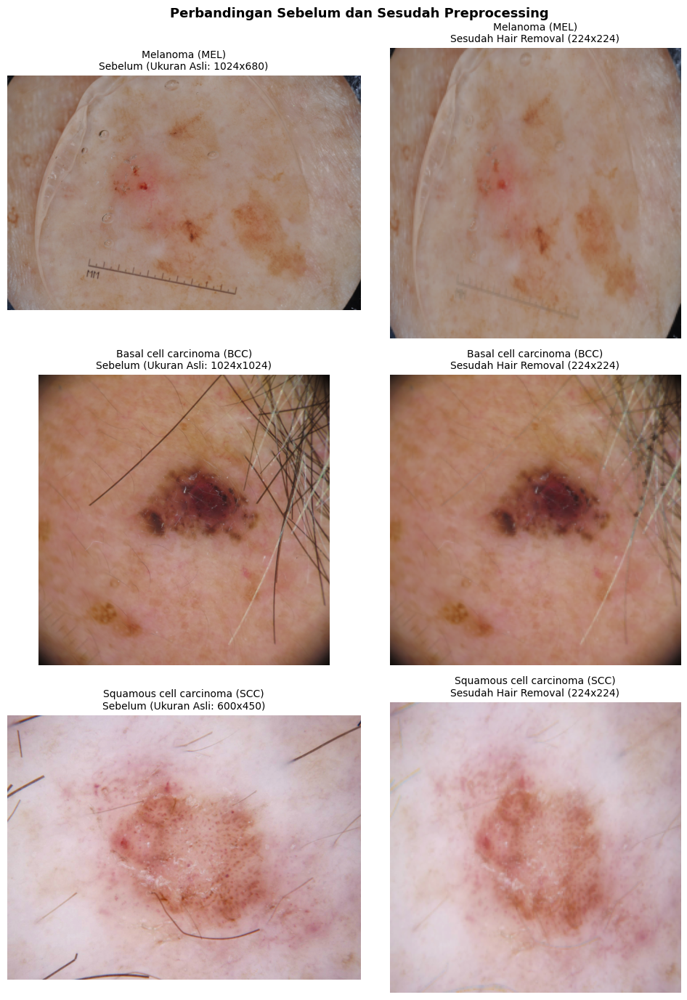

In [9]:
print("Perbandingan Sebelum & Sesudah Preprocessing")
print("=" * 50)

fig, axes = plt.subplots(3, 2, figsize=(10, 14))

for baris, nama_folder in enumerate(kelas_kanker):
    kode = kode_kelas[nama_folder]

    # Cari gambar pertama dari kelas ini
    for k, label in enumerate(y_labels):
        if label == kode:
            idx = k
            break

    # Kolom kiri gambar asli (hanya resize, tanpa hair removal)
    gambar_asli = cv2.imread(path_unik[idx])
    gambar_asli = cv2.cvtColor(gambar_asli, cv2.COLOR_BGR2RGB)
    ukuran_asli = gambar_asli.shape
    
    axes[baris, 0].imshow(gambar_asli)  # langsung tampilkan tanpa resize
    axes[baris, 0].set_title(
        f'{nama_folder} ({kode})\n'
        f'Sebelum (Ukuran Asli: {ukuran_asli[1]}x{ukuran_asli[0]})',fontsize=10) 
    axes[baris, 0].axis('off')

    # Kolom kanan — sesudah preprocessing (dari array X)
    axes[baris, 1].imshow(X[idx])
    axes[baris, 1].set_title(
        f'{nama_folder} ({kode})\n'f'Sesudah Hair Removal ({IMG_SIZE}x{IMG_SIZE})',fontsize=10)

    axes[baris, 1].axis('off')

plt.suptitle('Perbandingan Sebelum dan Sesudah Preprocessing', fontsize=13, fontweight='bold')
plt.tight_layout()
plt.show()

<div style="
    padding-left: 18px;
    border-left: 4px solid #111827;
    margin-top: 25px;
">
    
<h3 style="
    margin-bottom: 8px;
    font-size: 24px;
    font-weight: 600;
"> Tahap 5 - Simpan Hasil Preprocessing
</h3>

<p style="
    margin-top: 0;
    color: #555;
    line-height: 1.7;
">
</p> Setelah seluruh tahapan preprocessing sudah selesai, output dari notebook ini akan disimpan dan dijadikan input untuk notebook model deep learning kita

</div>

In [10]:
print("Simpan Output Preprocessing")
print("=" * 50)

np.save('/kaggle/working/X_preprocessed.npy', X)
np.save('/kaggle/working/y_labels.npy', y_labels)

print("File berhasil disimpan:")
print(f"X_preprocessed.npy : {X.shape[0]} gambar ({X.shape[1]}x{X.shape[2]} piksel)")
print(f"y_labels.npy       : {y_labels.shape[0]} label kelas")

print(" ")
print("Rekap Akhir")
print("=" * 50)
for nama_folder in kelas_kanker:
    kode   = kode_kelas[nama_folder]
    jumlah = np.sum(y_labels == kode)
    print(f"{nama_folder:30s} ({kode}) : {jumlah} gambar")
print(f"{'Total':30s}       : {len(y_labels)} gambar")

Simpan Output Preprocessing
File berhasil disimpan:
X_preprocessed.npy : 8458 gambar (224x224 piksel)
y_labels.npy       : 8458 label kelas
 
Rekap Akhir
Melanoma                       (MEL) : 4514 gambar
Basal cell carcinoma           (BCC) : 3316 gambar
Squamous cell carcinoma        (SCC) : 628 gambar
Total                                : 8458 gambar
